### Skin cancer is of one of the most common forms of cancer, affecting more than 3 million Americans a year. Early detection is crucial to treat skin cancer and prevent its spread. The code in this notebook uses one model to classify images of skin lesions into one of several cancerous or noncancerous categories, as well as a second model to segment the exact location of the lesion. The models were trained on the HAM10000 dataset, which contains 10,015 labeled images of skin lesions falling into seven categories.

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import (Conv2D,MaxPooling2D,BatchNormalization,Flatten,Dense,
                                     Dropout,Conv2DTranspose,UpSampling2D,concatenate)
import matplotlib.pyplot as plt
import seaborn as sns
import random
import os
from sklearn.model_selection import train_test_split
from pathlib import Path

cd = Path.cwd()
filepath = os.path.join(cd,r'OneDrive\Desktop\Datasets\skin-cancer')

images_path = os.path.join(filepath,'images')
gt_path = os.path.join(filepath,'GroundTruth.csv')

labels = pd.read_csv(gt_path)

image_paths = []
image_labels = []

for path in os.listdir(images_path):
    if 'jpg' in path:
        image_paths.append(os.path.join(images_path,path))
        label = np.array(labels.loc[labels.image==path[:-4]].drop('image',axis=1)).squeeze()
        image_labels.append(label)
    
image_paths = np.array(image_paths)
image_labels = np.array(image_labels)

label_names = ['Melanoma','Melanocytic Nevi','Basal Cell Carcinoma',"Bowen's Disease",
               'Benign Keratosis-Like Lesions','Dermatofibroma','Vascular Lesions']
labels_dict = {labels.columns[i+1]:label_names[i] for i in range(len(label_names))}

print('The labels are:')
for i in range(7):
    end = ['','\n'][i==3]
    print("{} ({}), ".format(label_names[i],labels.columns[i+1]),end=end)

labels

The labels are:
Melanoma (MEL), Melanocytic Nevi (NV), Basal Cell Carcinoma (BCC), Bowen's Disease (AKIEC), 
Benign Keratosis-Like Lesions (BKL), Dermatofibroma (DF), Vascular Lesions (VASC), 

,image,MEL,NV,BCC,AKIEC,BKL,DF,VASC
0,ISIC_0024306,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,ISIC_0024307,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,ISIC_0024308,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,ISIC_0024309,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,ISIC_0024310,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
10010,ISIC_0034316,1.0,0.0,0.0,0.0,0.0,0.0,0.0
10011,ISIC_0034317,1.0,0.0,0.0,0.0,0.0,0.0,0.0
10012,ISIC_0034318,0.0,0.0,0.0,0.0,1.0,0.0,0.0
10013,ISIC_0034319,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [2]:
def extract_image(path,dtype=tf.float32,mask=False):
    
    image = tf.io.read_file(path)
    image = tf.io.decode_image(image,expand_animations=False)
    image = tf.image.convert_image_dtype(image,dtype=dtype)
    if mask:
        if tf.shape(image)[-1] != 1:
            image = tf.expand_dims(tf.reduce_mean(image,-1),-1)
    
    return image

train_images,test_images,train_labels,test_labels = train_test_split(image_paths,image_labels,
                                                                     test_size=.03,random_state=12)

### This chart shows the breakdown of the images by label. Melanocytic nevi clearly dominates the list (fortunately, it is noncancerous), which means that the model will ultimately have to compensate in order to learn evenly.

Out of 10015 images: 


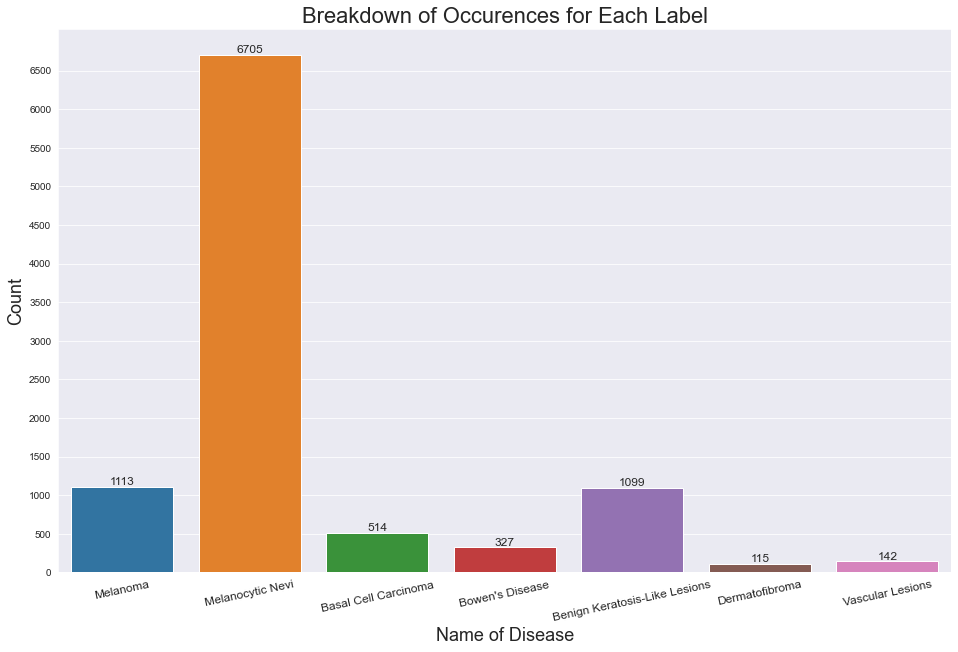

In [3]:
sums = list(labels.sum()[1:])
print('Out of {} images: '.format(len(image_paths)))

sns.set_style('darkgrid')
plt.figure(figsize=(16,10))
plot = sns.barplot(x=label_names,y=sums)
plot.bar_label(plot.containers[0],fontsize=12)
plt.xticks(rotation=12,fontsize=12)
plt.yticks(np.arange(0,6501,500))
plt.title('Breakdown of Occurences for Each Label',fontdict={'fontsize':22})
plt.xlabel('Name of Disease',fontdict={'fontsize':18})
plt.ylabel('Count',fontdict={'fontsize':18})
plt.show()

### A few example of images with labels:

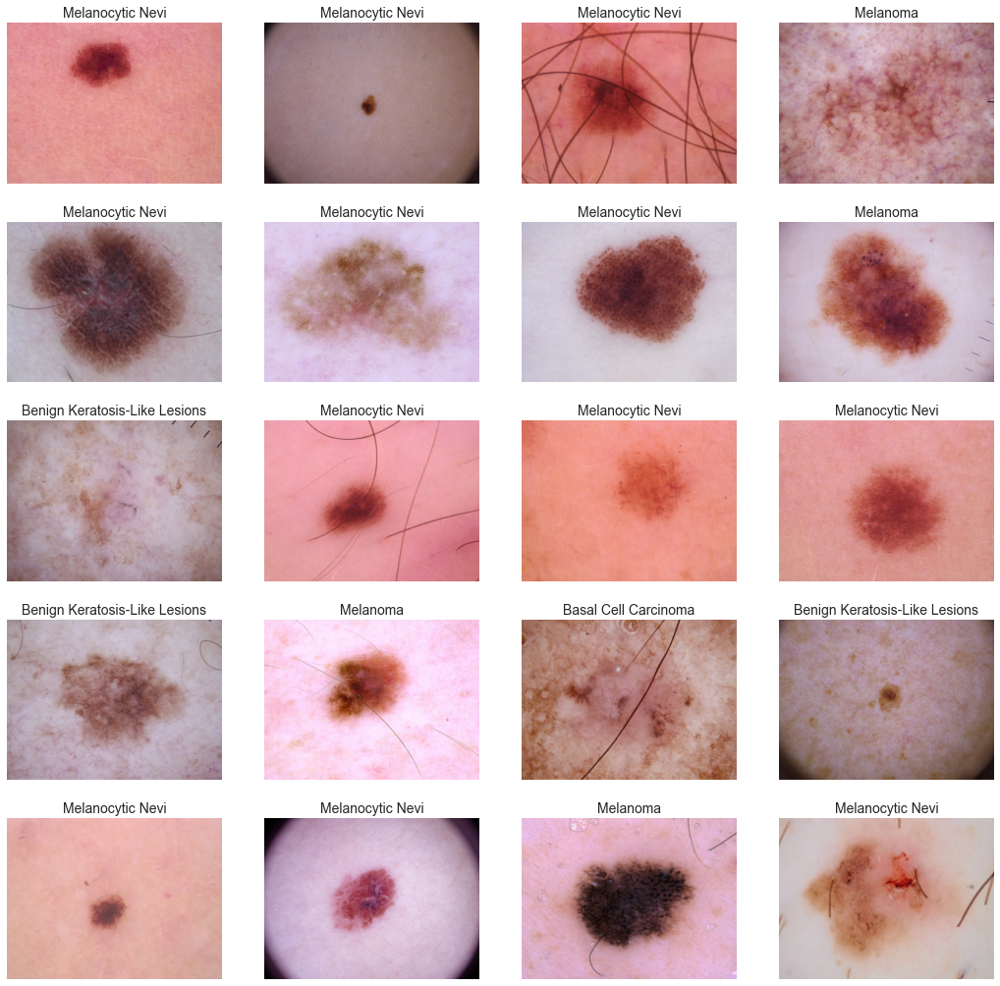

In [4]:
plt.figure(figsize=(18,18))
for i in range(20):
    num = random.randint(0,len(train_images)-1)
    image = extract_image(train_images[num])
    label = train_labels[num]
    label = label_names[label.argmax()]
    plt.subplot(5,4,i+1)
    plt.imshow(image)
    plt.axis('off')
    plt.title(label,fontdict={'fontsize':14})
plt.show()

### The make_dataset function creates a data pipeline to take one batch of image files and labels at a time, process it (which includes extracting the images from the files and randomly flipping the training images to prevent overfitting), and feed it into the model.

In [5]:
batch_size = 64

def make_dataset(X,y,train=True):
    
    dataset = tf.data.Dataset.from_tensor_slices((X,y))
    dataset = dataset.map(lambda x,y: (extract_image(x,dtype=tf.float16),y))
    if train: 
        dataset = dataset.map(lambda x,y: (tf.image.random_flip_left_right(x),y))
        dataset = dataset.map(lambda x,y: (tf.image.random_flip_up_down(x),y))
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    return dataset

train_dataset = make_dataset(train_images,train_labels)
test_dataset = make_dataset(test_images,test_labels,train=False)

### While the standard binary crossentropy loss would technically work for this multilabel classification problem, the imbalance of labels could cause the model to lean too heavily into outputting only the most common labels. To remedy this, I created an array of values to scale the loss of each label - meaning that binary crossentropy loss is taken for each of the seven classes and multiplied by a number such that each label has an equivalent effect on the total loss (so that the losses of infrequent positive labels are multiplied by large numbers, and those of more frequent labels are not.) 

In [6]:
positives = train_labels.sum(axis=0)
percentages = positives/len(train_labels)
scale_values = .5/percentages

class WeightedLoss(keras.losses.Loss):
    
    def __init__(self,scale_values):
        super().__init__()
        self.scale_values = scale_values
        self.bce = keras.losses.BinaryCrossentropy()
        
    def call(self,y_true,y_pred):
        
        loss = self.bce(y_true,y_pred)
        for i in range(7):
            loss += self.bce(y_true[i],y_pred[i]) * self.scale_values[i] * y_true[i]
        
        return loss
    
weighted_loss = WeightedLoss(scale_values)

### The model uses a series of convolutional, batch norm, and max pooling layers to reduce dimensionality before being flattened and fed into a series of fully connected layers. Dropout layers and l2 regularization help prevent overfitting.

In [7]:
dropout_rate = .5
l2 = keras.regularizers.L2(1e-5)

inputs = keras.Input(shape=extract_image(random.choice(train_images)).shape)
X = inputs 

saved_layers = []

filters = 16
for i in range(6):
    X = Conv2D(filters,(3,5),activation='selu',kernel_regularizer=l2)(X)
    saved_layers.append(X)
    X = BatchNormalization()(X)
    X = MaxPooling2D(2)(X)
    X = Dropout(dropout_rate)(X)
    filters *= 2
    
saved_layers.reverse()
    
for kernel_size in [3,2]:
    X = Conv2D(filters,kernel_size,activation='selu',kernel_regularizer=l2)(X)
    X = BatchNormalization()(X)
    X = Dropout(dropout_rate)(X)

X = Flatten()(X)

for i in range(4):
    X = Dense(4096,activation='selu',kernel_regularizer=l2)(X)
    X = BatchNormalization()(X)
    X = Dropout(dropout_rate)(X)
    
outputs = Dense(len(label_names),activation='sigmoid')(X)
    
model = keras.Model(inputs=inputs,
                   outputs=outputs)

optimizer = keras.optimizers.Adam(learning_rate=1e-4)
model.compile(loss=weighted_loss,
             optimizer=optimizer,
             metrics='accuracy')

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 450, 600, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 448, 596, 16)      736       
                                                                 
 batch_normalization (BatchN  (None, 448, 596, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 224, 298, 16)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 224, 298, 16)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 222, 294, 32)      7712  

### The model was trained on a GPU. The weights were downloaded and transfered here.

In [8]:
epochs = 0

schedule = lambda e,lr: 1e-4
lr_scheduler = keras.callbacks.LearningRateScheduler(schedule)

weights_path = os.path.join(filepath,'results','skin-lesion-weights.h5')
model.load_weights(weights_path)

history = model.fit(train_dataset,
                   validation_data=test_dataset,
                   epochs=epochs,
                   callbacks=lr_scheduler)

### Here's how the model performed (loss and accuracy) on the training and test datasets (only a sample of the training data is used):

In [9]:
sample_train_pairs = random.sample(list(zip(train_images,train_labels)),200)
sample_train_images = [tup[0] for tup in sample_train_pairs]
sample_train_labels = [tup[1] for tup in sample_train_pairs]
sample_train_dataset = make_dataset(sample_train_images,sample_train_labels)

train_loss,train_acc = model.evaluate(sample_train_dataset,verbose=0)
test_loss,test_acc = model.evaluate(test_dataset,verbose=0)

print('Training Loss:')
print(round(train_loss,4))

print('\nTraining Accuracy:')
print(round(train_acc,4))

print('\nTest Loss:')
print(round(test_loss,4))

print('\nTest Accuracy:')
print(round(test_acc,4))

Training Loss:
1.1473

Training Accuracy:
0.955

Test Loss:
0.7474

Test Accuracy:
0.9601


### Here are a bunch of images from the training data with the correct label on bottom and the predicted label on top:

TEST ON TRAINING IMAGES:


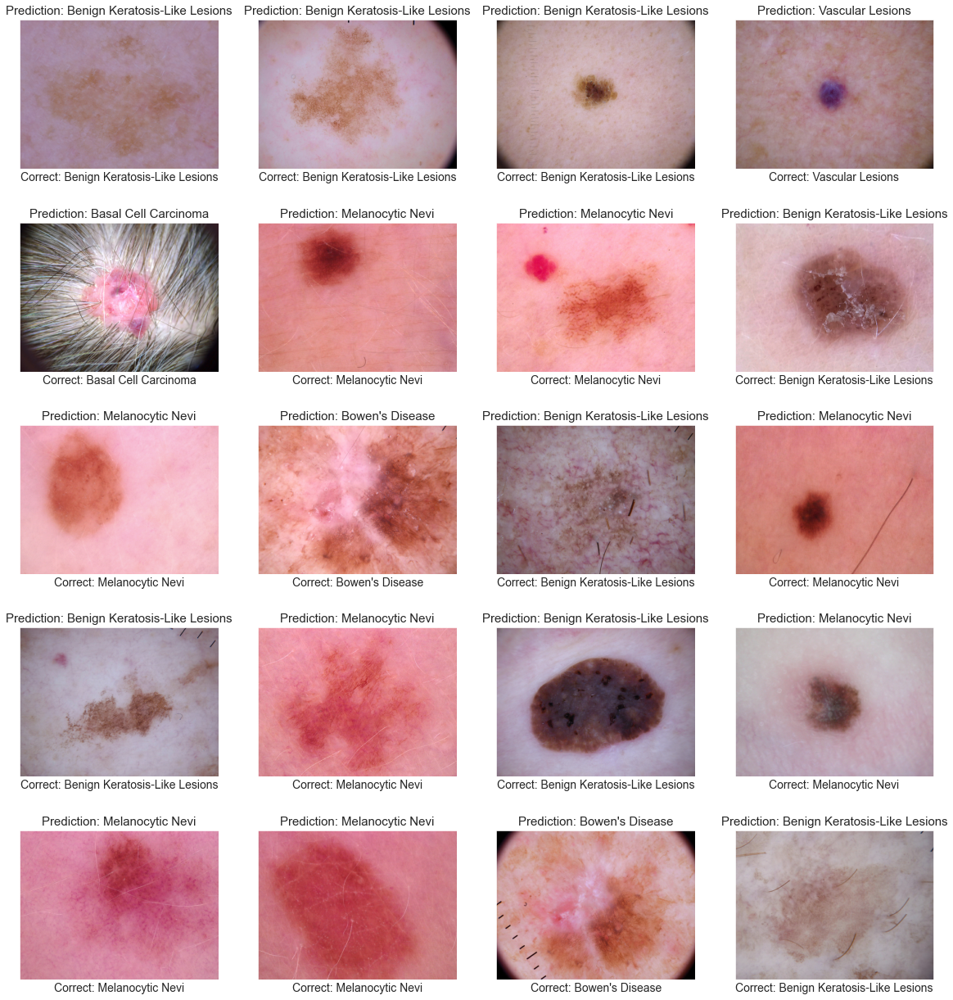

In [10]:
print('TEST ON TRAINING IMAGES:')

samples = random.sample(range(len(train_images)),20)
plt.figure(figsize=(20,22))

for i in range(len(samples)):
    image = extract_image(train_images[i])
    true_label = train_labels[i]
    true_label = label_names[true_label.argmax()]
    
    predicted_label = model.predict(tf.expand_dims(image,axis=0),verbose=0).squeeze()
    predicted_label = label_names[predicted_label.argmax()]
    
    plt.subplot(5,4,i+1)
    plt.imshow(image)
    plt.title('Prediction: {}'.format(predicted_label),fontdict={'fontsize':15})
    plt.xlabel('Correct: {}'.format(true_label),fontdict={'fontsize':14})
    plt.xticks(())
    plt.yticks(())
plt.show()

### And here's the same on a bunch of test images:

TEST ON TEST IMAGES:


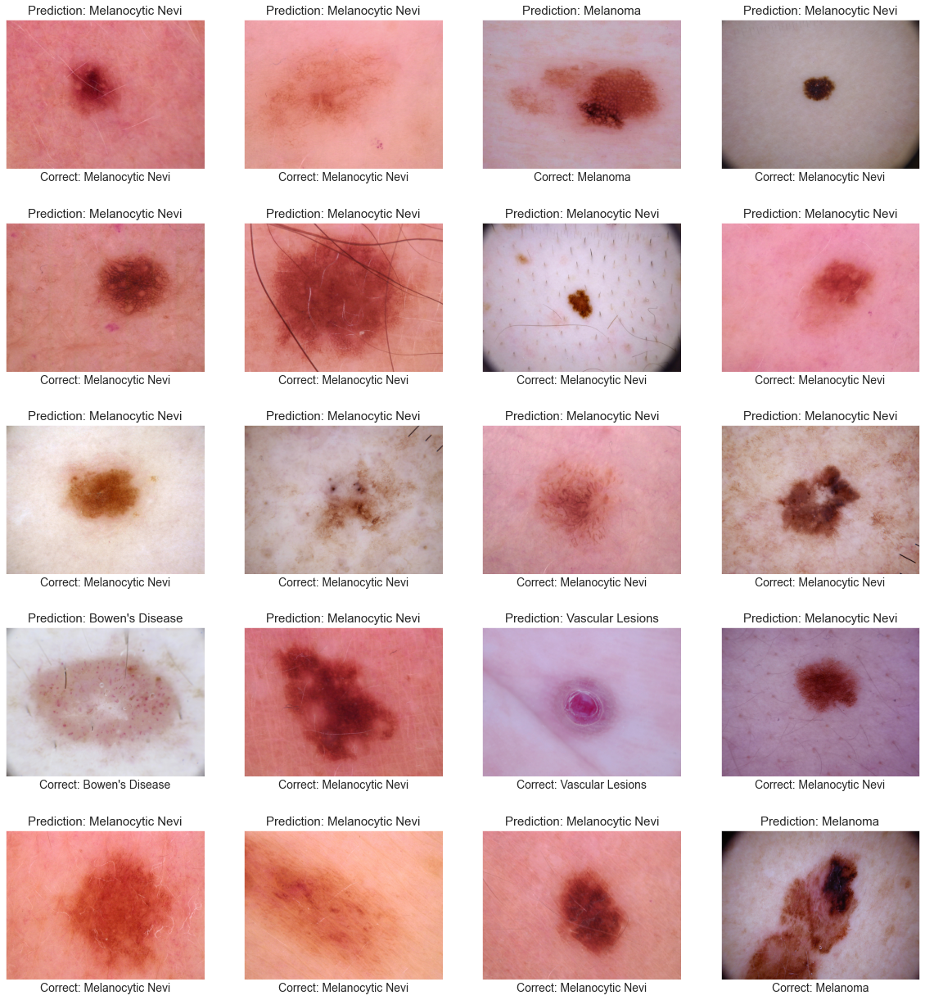

In [11]:
print('TEST ON TEST IMAGES:')

samples = random.sample(range(len(test_images)),20)
plt.figure(figsize=(20,22))

for i in range(len(samples)):
    image = extract_image(test_images[i])
    true_label = test_labels[i]
    true_label = test_labels[i]
    true_label = label_names[true_label.argmax()]
    
    predicted_label = model.predict(tf.expand_dims(image,axis=0),verbose=0).squeeze().round()
    predicted_label = label_names[predicted_label.argmax()]
    
    plt.subplot(5,4,i+1)
    plt.imshow(image)
    plt.title('Prediction: {}'.format(predicted_label),fontdict={'fontsize':15})
    plt.xlabel('Correct: {}'.format(true_label),fontdict={'fontsize':14})
    plt.xticks(())
    plt.yticks(())
plt.show()

### The second part of this notebook deals with segmenting the lesions within the images. This kind of model can be included in the backend of applications used in doctors' offices, hospitals, and clinics for computers to precisely delineate a lesion's location, size, and boundaries.

### The data include images as inputs and corresponding masks as outputs. Each mask is a two-dimensional image, of the same height and width as the input images, with each pixel being either a 0 or 1, marking whether or not that pixel is included in the segment.

In [12]:
masks_filepath = os.path.join(filepath,'masks')

train_masks = []
test_masks = []
seg = '_segmentation.png'

for path in train_images:
    if 'jpg' in path:
        iD = path.replace(filepath+'\images\\','').replace('.jpg','')
        mask_path = os.path.join(masks_filepath,iD+seg)
        train_masks.append(mask_path)
        
for path in test_images:
    if 'jpg' in path:
        iD = path.replace(filepath+'\images\\','').replace('.jpg','')
        mask_path = os.path.join(masks_filepath,iD+seg)
        test_masks.append(mask_path)

### To draw boundries, this function (draw_segment) takes an image and its corresponding mask, takes the gradients of the masks (which is essentially all the points in the mask at which 0's change to 1's and vice versa), and adds those gradients to the image (and clipping all values to be between 0 and 1), resuling in a thin line around the boundaries of the mask. The subsequent cell shows examples of this.

In [13]:
def draw_segment(image,mask):
    
    gradients = tf.image.image_gradients(mask)
    gradients = np.abs(gradients[0].numpy().squeeze()) + np.abs(gradients[1].numpy().squeeze())
    stacked = np.stack([gradients,gradients,gradients],axis=-1)
    segmented_image = image - stacked
    segmented_image = np.clip(segmented_image,0,1)
    
    return segmented_image

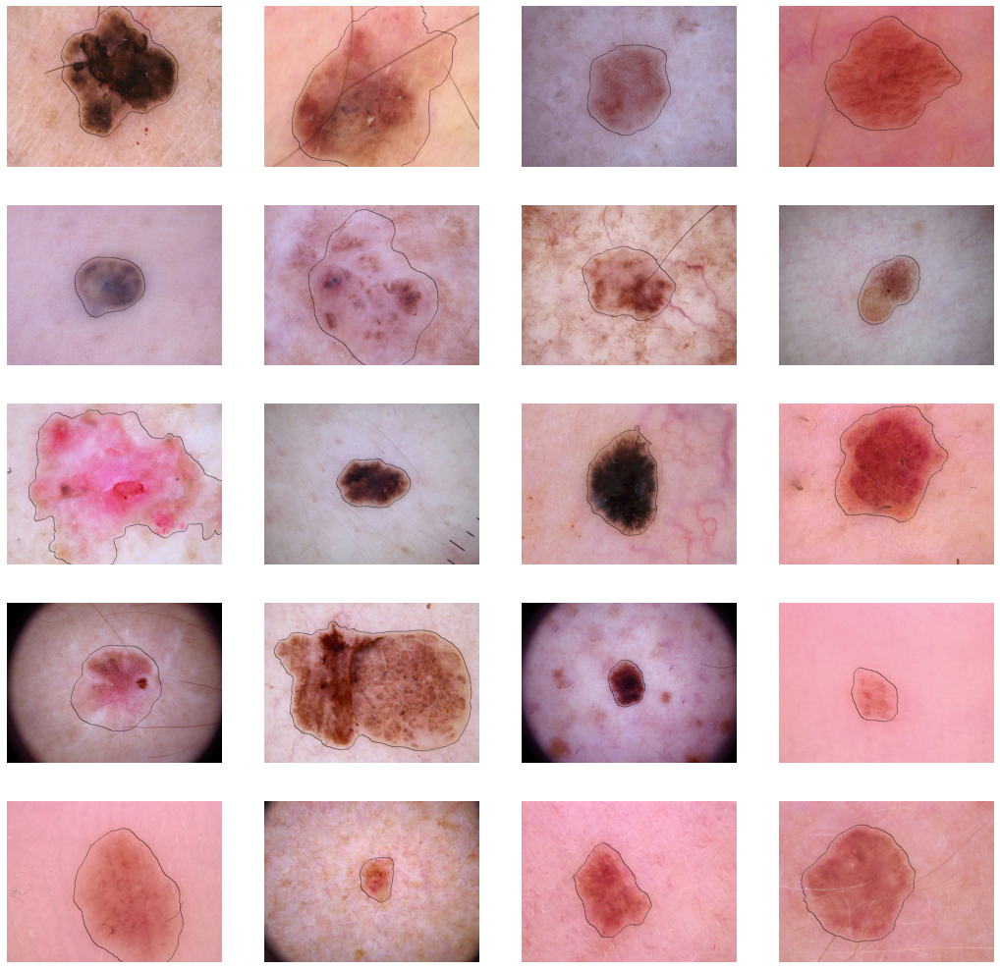

In [14]:
plt.figure(figsize=(18,18))
for i in range(20):
    n = random.randint(0,len(train_images)-1)
    image = extract_image(train_images[n])
    mask = extract_image(train_masks[n],mask=True)
    mask = tf.expand_dims(mask,0)
    segmented_image = draw_segment(image,mask)
    
    plt.subplot(5,4,i+1)
    plt.imshow(segmented_image)
    plt.axis('off')
plt.show()

### Here is another data pipeline for the dataset that uses images as inputs and masks as outputs. Files for the images and masks are processed by batch and, in the case of the training dataset, randomly augmented to reduce overfitting.

In [15]:
def random_augmentation(x,y):
    if random.randint(0,1) == 1:
        x = tf.image.flip_left_right(x)
        y = tf.image.flip_left_right(y)
    if random.randint(0,1) == 1:
        x = tf.image.flip_up_down(x)
        y = tf.image.flip_up_down(y)
    return x,y

batch_size = 24

def make_segmentation_dataset(x,y,train=True,dtype=tf.float16):
    
    dataset = tf.data.Dataset.from_tensor_slices((x,y))
    dataset = dataset.map(lambda x,y: (extract_image(x,dtype=dtype),extract_image(y,dtype=dtype,mask=True)))
    if train:
        dataset = dataset.map(random_augmentation)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    return dataset

train_segmentation_dataset = make_segmentation_dataset(train_images,train_masks)
test_segmentation_dataset = make_segmentation_dataset(test_images,test_masks)

### The model used to segment the images uses a "u-net" architecture, meaning that it first uses regular convolutional neural network to encode images, with the convolutional layers being saved for later use. The encoding then goes through a series of convolutional transpose and upsampling stages in which it is slowly increased back to the size of the mask (which in this case is 460x600x1). The saved layers from the model's first half (the encoder) are concatenated with layers of equal size in its second half (the decoder); these skip connections allow for the gradients to flow through multiple venues, preventing vanishing gradients and allowing different features additional paths of being trained.

### Fortunately, instead of training the entire u-net model from scratch, the classifier model from earlier in this notebook is used for the first half of the u-net model. Most of that model's layer are recycled and used here.

In [16]:
unet_input = model.input

X = Conv2D(3,(3,5),activation='selu',padding='same')(unet_input)
X = BatchNormalization()(X)

for layer in model.layers[1:31]:
    X = layer(X)
    
X = Conv2D(2048,(1,1),activation='selu')(X)
X = BatchNormalization()(X)
X = Conv2DTranspose(1024,(1,1),activation='selu')(X)
X = BatchNormalization()(X)
X = Conv2DTranspose(512,(2,1),activation='selu')(X)
X = Conv2D(512,(1,2),activation='selu')(X)

def conv_transpose_bloc(X,input_filters,second_transpose_kernel,saved_layer):
    X = Conv2DTranspose(input_filters,(3,5),activation='selu')(X)
    X = UpSampling2D()(X)
    X = Conv2DTranspose(input_filters,second_transpose_kernel,activation='selu')(X)
    X = concatenate([saved_layers[saved_layer],X])
    X = BatchNormalization()(X)
    X = Conv2D(input_filters*2,(1,1),activation='selu')(X)
    return X


input_filters = 512
saved_layer = 0
transpose_kernels = [(1,1),(1,2),(1,2),(2,2),(1,1),(1,1)]


for second_transpose_kernel in transpose_kernels:
    X = conv_transpose_bloc(X,input_filters,second_transpose_kernel,saved_layer)
    input_filters /= 2
    saved_layer += 1

X = Conv2DTranspose(16,(3,5),activation='selu')(X)
X = BatchNormalization()(X)
outputs = Conv2D(1,(1,1),activation='sigmoid')(X)

unet_model = keras.Model(inputs=unet_input,
                        outputs=outputs)

unet_model.compile(loss='binary_crossentropy',
                  optimizer='adam',
                  metrics='accuracy')

unet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 450, 600, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_8 (Conv2D)              (None, 450, 600, 3)  138         ['input_1[0][0]']                
                                                                                                  
 batch_normalization_12 (BatchN  (None, 450, 600, 3)  12         ['conv2d_8[0][0]']               
 ormalization)                                                                                    
                                                                                            

### As with the previous model, this one was trained elsewhere on a gpu, and the weights were transfered here.

In [17]:
epochs = 0

unet_weights_path = os.path.join(filepath,'results','skin-lesion-unet-weights.h5')
unet_model.load_weights(unet_weights_path)

unet_model.fit(train_segmentation_dataset,
              validation_data=test_segmentation_dataset,
              epochs=epochs)

### Here is the model's performance, in terms of loss and accuracy, on the training (a small sample) and test data. Accuracy here measures the pixels correctly classified as being included in, or excluded from, the segment.

In [18]:
sample_seg_train_pairs = random.sample(list(zip(train_images,train_masks)),112)
sample_seg_train_images = [tup[0] for tup in sample_seg_train_pairs]
sample_seg_train_labels = [tup[1] for tup in sample_seg_train_pairs]
sample_seg_train_dataset = make_segmentation_dataset(sample_seg_train_images,sample_seg_train_labels)

unet_train_loss,unet_train_acc = unet_model.evaluate(sample_seg_train_dataset,verbose=0)
unet_test_loss,unet_test_acc = unet_model.evaluate(test_segmentation_dataset,verbose=0)

print('Training Loss:')
print(round(unet_train_loss,4))

print('\nTraining Accuracy:')
print(round(unet_train_acc,4))

print('\nTest Loss:')
print(round(unet_test_loss,4))

print('\nTest Accuracy:')
print(round(unet_test_acc,4))

Training Loss:
0.2349

Training Accuracy:
0.939

Test Loss:
0.2015

Test Accuracy:
0.9455


### A demonstration of the model predicting boundaries on test data:

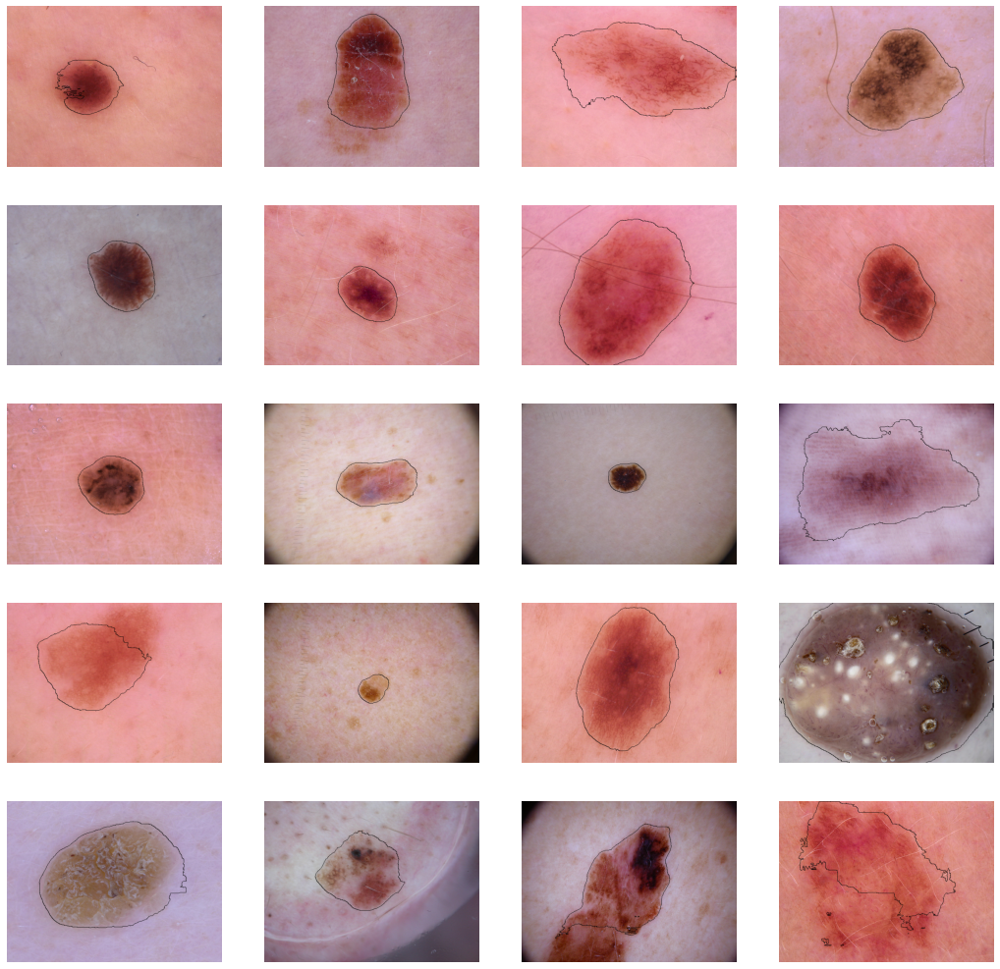

In [19]:
plt.figure(figsize=(18,18))
for i in range(20):
    n = random.randint(0,len(test_images)-1)

    image = extract_image(test_images[n])

    masked_image = unet_model(tf.expand_dims(image,0))
    masked_image = tf.round(masked_image)
    segmented_image = draw_segment(image,masked_image)

    plt.subplot(5,4,i+1)
    plt.imshow(segmented_image)
    plt.axis('off')
plt.show()

### Finally, a combination of the two models - images from the test set are classified by the first model and recieve boundaries from the second.

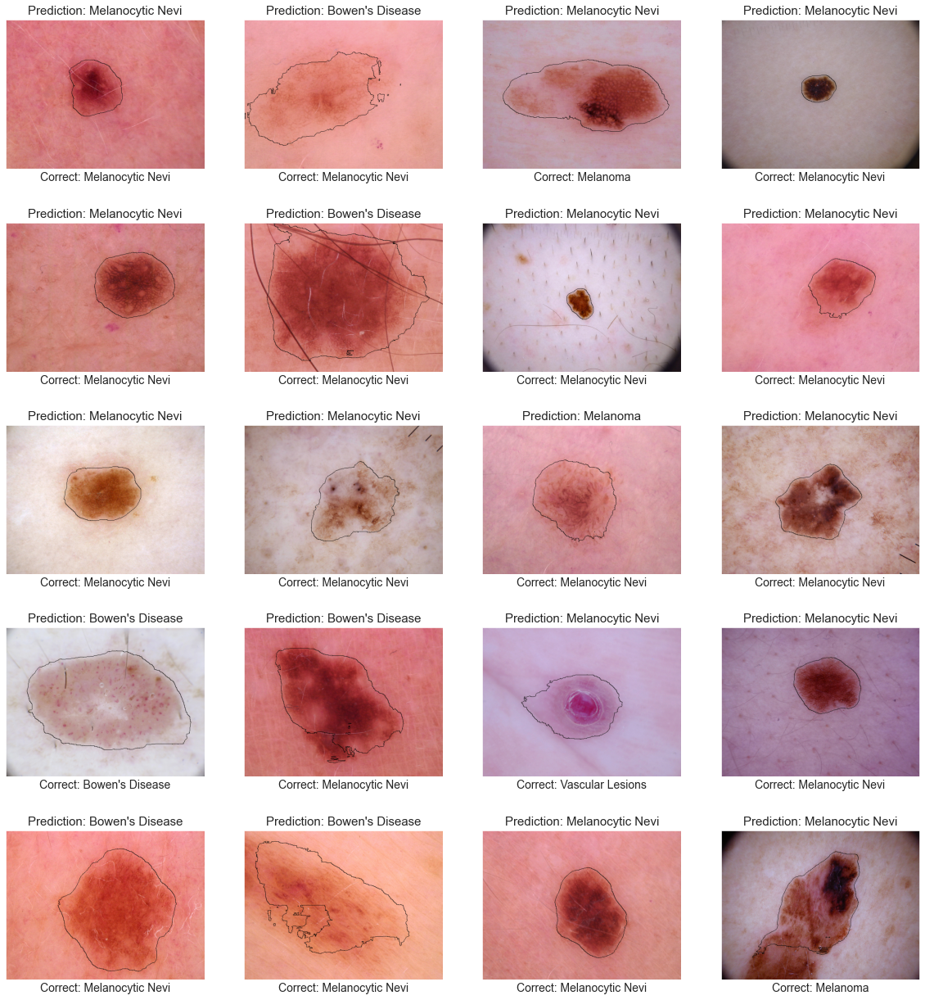

In [20]:
samples = random.sample(range(len(test_images)),20)
plt.figure(figsize=(20,22))

for i in range(len(samples)):
    image = extract_image(test_images[i])
    true_label = test_labels[i]
    true_label = label_names[true_label.argmax()]
    
    predicted_label = model.predict(tf.expand_dims(image,axis=0),verbose=0).squeeze().round()
    predicted_label = label_names[predicted_label.argmax()]
    
    masked_image = unet_model(tf.expand_dims(image,0))
    masked_image = tf.round(masked_image)
    segmented_image = draw_segment(image,masked_image)
    
    plt.subplot(5,4,i+1)
    plt.imshow(segmented_image)
    plt.title('Prediction: {}'.format(predicted_label),fontdict={'fontsize':15})
    plt.xlabel('Correct: {}'.format(true_label),fontdict={'fontsize':14})
    plt.xticks(())
    plt.yticks(())
plt.show()